## Preparing the Data
영어, 독일어 spacy 모델 다운로드

In [1]:
!pip install torchtext==0.11.0
!python -m spacy download en_core_web_sm
!python -m spacy download de_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 8.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.9/881.9 MB 4.1 MB/s eta 0:00:0000:0100:03
  Attempting uninstall: torch
    Found existing installation: torch 1.8.0
    Uninstalling torch-1.8.0:
      Successfully uninstalled torch-1.8.0
  Attempting uninstall: torchtext
    Found existing installation: torchtext 0.9.0
    Uninstalling torchtext-0.9.0:
      Successfully uninstalled torchtext-0.9.0
/home/mmlab/anaconda3/envs/nlp_python_3.8/lib/python3.8/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB

필요한 library import

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim

import torchtext
from torchtext.legacy.datasets import Multi30k
from torchtext.legacy.data import Field, BucketIterator

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import spacy
import numpy as np

import random
import math
import time

Random Seed 지정

In [2]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

독일어, 영어 spacy 모델 로드.

sequence 를 토큰화하여 단어, 문장 부호, 품사 등으로 표현할 수 있음.

In [3]:
spacy_de = spacy.load('de_core_news_sm')
spacy_en = spacy.load('en_core_web_sm')

tokenizer 함수를 정의한다.
input : text 문자열
output : 토큰들의 리스트 tok

In [4]:
def tokenize_de(text):
    return [tok.text for tok in spacy_de.tokenizer(text)]

def tokenize_en(text):
    return [tok.text for tok in spacy_en.tokenizer(text)]

torchtext의 Field 클래스를 이용해 데이터 전처리 방식을 설정한다.

Source (SRC)는 독일어 tokenizer를 이용하고 Start of sentence(sos), end of sentence(eos) 를 시작 토큰, 끝 토큰으로 설정한다. lower = True 설정으로 대문자를 소문자로 처리한다. batch_first = True 로 데이터의 dimension은 (batch_size, fixed_length) 가 됨.

In [5]:
SRC = Field(tokenize = tokenize_de,
           init_token = '<sos>',
           eos_token = '<eos>',
           lower = True,
           batch_first = True)

TRG = Field(tokenize = tokenize_en,
           init_token = '<sos>',
           eos_token = '<eos>',
           lower = True,
           batch_first = True)

Multi30k 데이터 다운로드

In [6]:
train_data, valid_data, test_data = Multi30k.splits(exts = ('.de', '.en'),
                                                   fields = (SRC, TRG))

source와 target vocabulary 생성.
vocabulary는 각 토큰에 index를 부여하며, 아래 코드에서는 2회 이상 등장한 단어에 대해서 vocabulary에 포함한다.

In [7]:
SRC.build_vocab(train_data, min_freq = 2)
TRG.build_vocab(train_data, min_freq = 2)

In [8]:
print(len(SRC.vocab))
SRC.vocab.stoi

7853


defaultdict(<bound method Vocab._default_unk_index of <torchtext.legacy.vocab.Vocab object at 0x7fdb4c1626a0>>,
            {'<unk>': 0,
             '<pad>': 1,
             '<sos>': 2,
             '<eos>': 3,
             '.': 4,
             'ein': 5,
             'einem': 6,
             'in': 7,
             'eine': 8,
             ',': 9,
             'und': 10,
             'mit': 11,
             'auf': 12,
             'mann': 13,
             'einer': 14,
             'der': 15,
             'frau': 16,
             'die': 17,
             'zwei': 18,
             'einen': 19,
             'im': 20,
             'an': 21,
             'von': 22,
             'sich': 23,
             'dem': 24,
             'mädchen': 25,
             'junge': 26,
             'vor': 27,
             'zu': 28,
             'steht': 29,
             'männer': 30,
             'sitzt': 31,
             'hund': 32,
             'den': 33,
             'straße': 34,
             'während': 35,
  

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Dataloader 의 역할을 하는 BucketIterator 로 batch iterator를 생성한다.

이때 BucketIterator은 비슷한 길이의 데이터를 함께 묶는 iterator임. 

In [10]:
BATCH_SIZE = 128

train_iterator, valid_iterator, test_iterator = BucketIterator.splits(
(train_data, valid_data, test_data),
batch_size = BATCH_SIZE,
device = device)

# Model Architecture

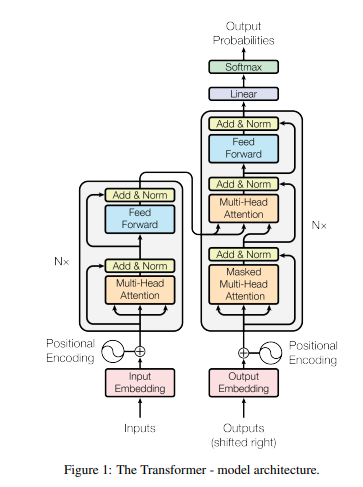

input sequence of symbols $ x_1,...,x_n $을 representation $ z = (z_1,...,z_n) $ 로 매핑하는 encoder 구조, $ z $ 를 이용해 output sequence $ y_1,...,y_m $ 를 생성하는 decoder 구조로 구성됨.

In [29]:
class Encoder(nn.Module):
    """
    input dim : 입력 시퀀스 차원 (vocabulary 에서 매핑된 정수 인덱스)
    hid_dim : token embedding dimension
    n_layers : 인코더 layer
    n_heads : multi head attention
    pf_dim : feed forward network 후 dimension. 아마 512?
    """
    def __init__(self,
                input_dim,
                hid_dim,
                n_layers,
                n_heads,
                pf_dim,
                dropout,
                device,
                max_length = 100):
        super().__init__()
        
        self.device = device
        
        self.tok_embedding = nn.Embedding(input_dim, hid_dim)
        
        """
        논문에서는 sinusoidal position embedding (학습되지 않는 고정된 position embedding)
        사용하지만 코드에서는 학습되는 position embedding 사용.
        """
        self.pos_embedding = nn.Embedding(max_length, hid_dim)
        
        self.layers = nn.ModuleList([EncoderLayer(hid_dim,
                                                 n_heads,
                                                 pf_dim,
                                                 dropout,
                                                 device)
                                    for _ in range(n_layers)])
        
        self.dropout = nn.Dropout(dropout)
        
        self.scale = torch.sqrt(torch.FloatTensor([hid_dim])).to(device)
        
    def forward(self, src, src_mask):
        '''
        src = [batch_size, src_len] batch_first = True 설정 기억
        '''
        batch_size = src.shape[0]
        src_len = src.shape[1]
        '''
        torch.arange(0, src_len) : [0,1,2,...,src_len]
        .unsqueeze(0) : 0 번째 인덱스에 1인 차원 생성 [[0,1,2,...,src_len]]
        repeat(batch_size, 1) : dim 0으로 batch_size 만큼, dim 1로 1만큼 반복
        [[0,1,2,...,src_len],
        [0,1,2,...,src_len],
        [0,1,2,...,src_len],
        .
        .
        .]
        '''
        pos = torch.arange(0, src_len).unsqueeze(0).repeat(batch_size, 1).to(self.device)
        print(pos.shape)
        print(pos)
            
        print(src.shape)
        print(src)
        src = self.dropout((self.tok_embedding(src) * self.scale) + self.pos_embedding(pos))
        print(src.shape)
        print(src)
            
        for layer in self.layers:
            src = layer(src, src_mask)
                
        return src

In [30]:
class EncoderLayer(nn.Module):
    def __init__(self,
                hid_dim,
                n_heads,
                pf_dim,
                dropout,
                device):
        super().__init__()
        
        self.self_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.ff_layer_norm = nn.LayerNorm(hid_dim)
        
        self.self_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.positionwise_feedforward = PositionwiseFeedforwardLayer(hid_dim,
                                                                    pf_dim,
                                                                    dropout)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, src, src_mask):
        
        """
        multi-head self attention 수행. Query, Key, Value 모두 
        이전 Encoder Layer 의 output.
        """
        _src, _ = self.self_attention(src, src, src, src_mask)
        src = self.self_attn_layer_norm(src + self.dropout(_src))
        
        _src = self.positionwise_feedforward(src)
        
        src = self.ff_layer_norm(src + self.dropout(_src))
        
        return src

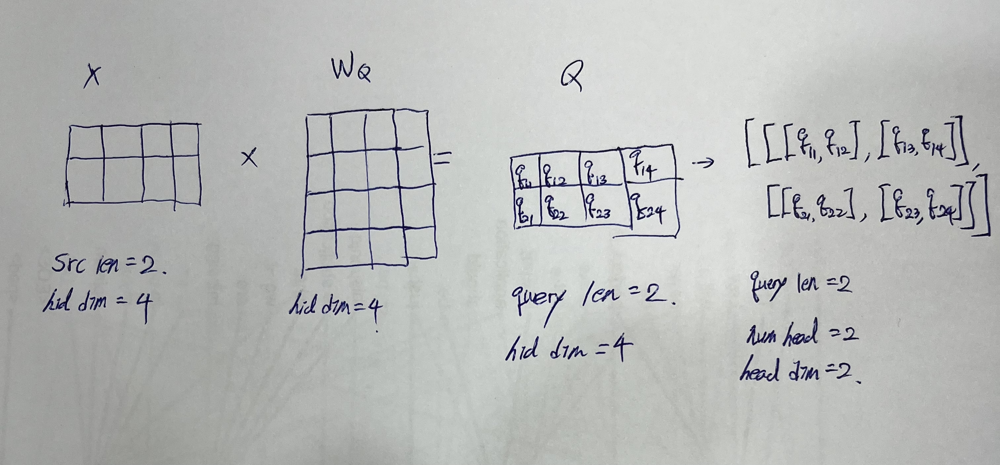

src 로 부터 linear layer 통과 하며 Q가 생성되고 multi head로 차원이 split 됨

In [31]:
class MultiHeadAttentionLayer(nn.Module):
    def __init__(self, hid_dim, n_heads, dropout, device):
        super().__init__()
        
        assert hid_dim % n_heads == 0
        
        self.hid_dim = hid_dim
        
        """
        multi head attention의 head 수
        hidden dimension을 각각의 head가 나누어서 살펴본다..
        """
        self.n_heads = n_heads
        self.head_dim = hid_dim // n_heads
        
        """
        WQ, WK, WV
        """
        self.fc_q = nn.Linear(hid_dim, hid_dim)
        self.fc_k = nn.Linear(hid_dim, hid_dim)
        self.fc_v = nn.Linear(hid_dim, hid_dim)
        
        
        self.fc_o = nn.Linear(hid_dim, hid_dim)
        
        self.dropout = nn.Dropout(dropout)
        
        self.scale = torch.sqrt(torch.FloatTensor([self.head_dim])).to(device)
        
    def forward(self, query, key, value, mask = None):
        """
        query = [batch size, query len, hid dim]
        key = [batch size, key len, hid dim]
        value = [batch size, value len, hid dim]
        현재 encoder class 에서 self_attention(src, src, src, src_mask) 가 들어옴.
        """
        batch_size = query.shape[0]
        
        """
        Q = q * WQ = [batch size, query len, hid dim]
        K = k * WK = [batch size, key len, hid dim]
        V = v * WV = [batch size, val len, hid dim]
        """
        Q = self.fc_q(query)
        K = self.fc_k(key)
        V = self.fc_v(value)
        
        """
        view 는 numpy 의 reshape와 같은 역할.
        [batch size, query len, hid dim] -> [batch size, query len, n heads, head dim]
        으로 변환
        
        permute(0,2,1,3)
        Q : [batch size, n heads, query len, head dim]
        K : [batch size, n heads, key len, head dim]
        V : [batch size, n heads, val len, head dim]
        """
        Q = Q.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        K = K.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        V = V.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        
        
        """
        energy : Q * K^T scaled dot product attention
        """
        energy = torch.matmul(Q, K.permute(0, 1, 3, 2)) / self.scale
        
        if mask is not None:
            energy = energy.masked_fill(mask == 0, -1e10)
        
        """
        dot product attention 과정의 softmax
        이후 Value 곱함
        """
        attention = torch.softmax(energy, dim = -1)
        x = torch.matmul(self.dropout(attention), V)
        
        """
        x =
        [batch size, n heads, query len, head dim]
        -> [batch size, query len, n heads, head dim]
        """
        x = x.permute(0, 2, 1, 3).contiguous()
        
        x = x.view(batch_size, -1, self.hid_dim)
        """
        attention 결과에 linear layer 취함.
        """
        x = self.fc_o(x)
        
        return x, attention

In [53]:
class PositionwiseFeedforwardLayer(nn.Module):
    def __init__(self, hid_dim, pf_dim, dropout):
        super().__init__()
        self.fc_1 = nn.Linear(hid_dim, pf_dim)
        self.fc_2 = nn.Linear(pf_dim, hid_dim)
        
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, x):
        """
        2개의 linear layer로 구성됨.
        linear layer 사이에는 relu와 dropout.
        """
        x = self.dropout(torch.relu(self.fc_1(x)))
        x = self.fc_2(x)
        
        return x

In [73]:
"""
기본적으로 Encoder 구조와 동일함.
DecoderLayer class에서 encoder의 output을 input으로 받는
cross attention layer 추가됨.
"""
class Decoder(nn.Module):
    def __init__(self,
                output_dim,
                hid_dim,
                n_layers,
                n_heads,
                pf_dim,
                dropout,
                device,
                max_length = 100):
        super().__init__()
        
        self.device = device
        self.tok_embedding = nn.Embedding(output_dim, hid_dim)
        self.pos_embedding = nn.Embedding(max_length, hid_dim)
        self.layers = nn.ModuleList([DecoderLayer(hid_dim,
                                                 n_heads,
                                                 pf_dim,
                                                 dropout,
                                                 device)
                                    for _ in range(n_layers)])
        
        self.fc_out = nn.Linear(hid_dim, output_dim)
        
        self.dropout = nn.Dropout(dropout)
        self.scale = torch.sqrt(torch.FloatTensor([hid_dim])).to(device)
        
    def forward(self, trg, enc_src, trg_mask, src_mask):
        
        batch_size = trg.shape[0]
        trg_len = trg.shape[1]
        
        pos = torch.arange(0, trg_len).unsqueeze(0).repeat(batch_size, 1).to(self.device)
        
        trg = self.dropout((self.tok_embedding(trg) * self.scale) + self.pos_embedding(pos))
        
        for layer in self.layers:
            trg, attention = layer(trg, enc_src, trg_mask, src_mask)
            
        output = self.fc_out(trg)
    
        return output, attention

In [74]:
class DecoderLayer(nn.Module):
    def __init__(self, 
                 hid_dim, 
                 n_heads, 
                 pf_dim, 
                 dropout, 
                 device):
        super().__init__()
        self.self_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.enc_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.ff_layer_norm = nn.LayerNorm(hid_dim)
        self.self_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.encoder_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.positionwise_feedforward = PositionwiseFeedforwardLayer(hid_dim, 
                                                                     pf_dim, 
                                                                     dropout)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, trg, enc_src, trg_mask, src_mask):
        
        #trg = [batch size, trg len, hid dim]
        #enc_src = [batch size, src len, hid dim]
        #trg_mask = [batch size, 1, trg len, trg len]
        #src_mask = [batch size, 1, 1, src len]
       
        #self attention
        _trg, _ = self.self_attention(trg, trg, trg, trg_mask)
        
        #dropout, residual connection and layer norm
        trg = self.self_attn_layer_norm(trg + self.dropout(_trg))
            
        #trg = [batch size, trg len, hid dim]
       
        #encoder attention
        _trg, attention = self.encoder_attention(trg, enc_src, enc_src, src_mask)

        
        #dropout, residual connection and layer norm
        trg = self.enc_attn_layer_norm(trg + self.dropout(_trg))
                    
        #trg = [batch size, trg len, hid dim]

        #positionwise feedforward
        _trg = self.positionwise_feedforward(trg)
        
        #dropout, residual and layer norm
        trg = self.ff_layer_norm(trg + self.dropout(_trg))
        
        #trg = [batch size, trg len, hid dim]
        #attention = [batch size, n heads, trg len, src len]
        
        return trg, attention


In [75]:
class Seq2Seq(nn.Module):
    def __init__(self, 
                 encoder, 
                 decoder, 
                 src_pad_idx, 
                 trg_pad_idx, 
                 device):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.src_pad_idx = src_pad_idx
        self.trg_pad_idx = trg_pad_idx
        self.device = device
        
    def make_src_mask(self, src):
        
        #src = [batch size, src len]
        src_mask = (src != self.src_pad_idx).unsqueeze(1).unsqueeze(2)

        #src_mask = [batch size, 1, 1, src len]

        return src_mask
    
    def make_trg_mask(self, trg):
        
        #trg = [batch size, trg len]
        trg_pad_mask = (trg != self.trg_pad_idx).unsqueeze(1).unsqueeze(2)
        
        #trg_pad_mask = [batch size, 1, 1, trg len]
        
        trg_len = trg.shape[1]

        trg_sub_mask = torch.tril(torch.ones((trg_len, trg_len), device = self.device)).bool()
        
        #trg_sub_mask = [trg len, trg len]
        trg_mask = trg_pad_mask & trg_sub_mask
        
        #trg_mask = [batch size, 1, trg len, trg len]
        
        return trg_mask

    def forward(self, src, trg):
        
        #src = [batch size, src len]
        #trg = [batch size, trg len]
        src_mask = self.make_src_mask(src)
        trg_mask = self.make_trg_mask(trg)
        
        #src_mask = [batch size, 1, 1, src len]
        #trg_mask = [batch size, 1, trg len, trg len]
        enc_src = self.encoder(src, src_mask)
        
        #enc_src = [batch size, src len, hid dim]
        output, attention = self.decoder(trg, enc_src, trg_mask, src_mask)
        
        #output = [batch size, trg len, output dim]
        #attention = [batch size, n heads, trg len, src len]
        
        return output, attention


In [76]:
INPUT_DIM = len(SRC.vocab)
OUTPUT_DIM = len(TRG.vocab)
HID_DIM = 256
ENC_LAYERS = 3
DEC_LAYERS = 3
ENC_HEADS = 8
DEC_HEADS = 8
ENC_PF_DIM = 512
DEC_PF_DIM = 512
ENC_DROPOUT = 0.1
DEC_DROPOUT = 0.1

enc = Encoder(INPUT_DIM, 
              HID_DIM, 
              ENC_LAYERS, 
              ENC_HEADS, 
              ENC_PF_DIM, 
              ENC_DROPOUT, 
              device)

dec = Decoder(OUTPUT_DIM, 
              HID_DIM, 
              DEC_LAYERS, 
              DEC_HEADS, 
              DEC_PF_DIM, 
              DEC_DROPOUT, 
              device)

In [77]:
SRC_PAD_IDX = SRC.vocab.stoi[SRC.pad_token]
TRG_PAD_IDX = TRG.vocab.stoi[TRG.pad_token]

model = Seq2Seq(enc, dec, SRC_PAD_IDX, TRG_PAD_IDX, device).to(device)

In [78]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 9,038,341 trainable parameters


In [79]:
def initialize_weights(m):
    if hasattr(m, 'weight') and m.weight.dim() > 1:
        nn.init.xavier_uniform_(m.weight.data)

In [80]:
model.apply(initialize_weights);

In [81]:
LEARNING_RATE = 0.0005

optimizer = torch.optim.Adam(model.parameters(), lr = LEARNING_RATE)

In [82]:
criterion = nn.CrossEntropyLoss(ignore_index = TRG_PAD_IDX)

In [83]:
def train(model, iterator, optimizer, criterion, clip):
    
    model.train()
    
    epoch_loss = 0
    
    for i, batch in enumerate(iterator):
        
        src = batch.src
        trg = batch.trg
        
        optimizer.zero_grad()
        output, _ = model(src, trg[:,:-1])
                
        #output = [batch size, trg len - 1, output dim]
        #trg = [batch size, trg len]
        
        output_dim = output.shape[-1]
        
        output = output.contiguous().view(-1, output_dim)
        trg = trg[:,1:].contiguous().view(-1)
                
        #output = [batch size * trg len - 1, output dim]
        #trg = [batch size * trg len - 1]
        loss = criterion(output, trg)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        
        optimizer.step()
        epoch_loss += loss.item()
        
    return epoch_loss / len(iterator)


In [84]:
def evaluate(model, iterator, criterion):
    
    model.eval()
    
    epoch_loss = 0
    
    with torch.no_grad():
    
        for i, batch in enumerate(iterator):
            src = batch.src
            trg = batch.trg

            output, _ = model(src, trg[:,:-1])
            
            #output = [batch size, trg len - 1, output dim]
            #trg = [batch size, trg len]
            
            output_dim = output.shape[-1]
            
            output = output.contiguous().view(-1, output_dim)
            trg = trg[:,1:].contiguous().view(-1)
            
            #output = [batch size * trg len - 1, output dim]
            #trg = [batch size * trg len - 1]
            
            loss = criterion(output, trg)

            epoch_loss += loss.item()
        
    return epoch_loss / len(iterator)


In [85]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [86]:
N_EPOCHS = 10
CLIP = 1

best_valid_loss = float('inf')
for epoch in range(N_EPOCHS):
    
    start_time = time.time()
    
    train_loss = train(model, train_iterator, optimizer, criterion, CLIP)
    valid_loss = evaluate(model, valid_iterator, criterion)
    
    end_time = time.time()
    
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    """
    loss 가 가장 작은 모델 저장
    """
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'tut6-model.pt')
    
    print(f'Epoch: {epoch+1:02} | Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train PPL: {math.exp(train_loss):7.3f}')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. PPL: {math.exp(valid_loss):7.3f}')

torch.Size([128, 33])
tensor([[ 0,  1,  2,  ..., 30, 31, 32],
        [ 0,  1,  2,  ..., 30, 31, 32],
        [ 0,  1,  2,  ..., 30, 31, 32],
        ...,
        [ 0,  1,  2,  ..., 30, 31, 32],
        [ 0,  1,  2,  ..., 30, 31, 32],
        [ 0,  1,  2,  ..., 30, 31, 32]], device='cuda:0')
torch.Size([128, 33])
tensor([[ 2,  5, 13,  ...,  1,  1,  1],
        [ 2, 18, 26,  ...,  1,  1,  1],
        [ 2,  5, 13,  ...,  1,  1,  1],
        ...,
        [ 2,  5, 25,  ...,  1,  1,  1],
        [ 2, 30, 74,  ...,  1,  1,  1],
        [ 2,  5, 25,  ...,  1,  1,  1]], device='cuda:0')
torch.Size([128, 33, 256])
tensor([[[ 0.5081, -0.1687,  0.0325,  ..., -0.0292,  0.2370, -0.0417],
         [ 0.1502,  0.0000, -0.2861,  ...,  0.0202,  0.4719,  0.0677],
         [-0.1811,  0.0000, -0.3734,  ..., -0.3580, -0.2468, -0.0267],
         ...,
         [ 0.5958, -0.0293,  0.0566,  ..., -0.1553,  0.1761, -0.5137],
         [ 0.4519, -0.1296,  0.0000,  ..., -0.2387,  0.1153, -0.4385],
         [ 0.4434,

In [87]:
model.load_state_dict(torch.load('tut6-model.pt'))

test_loss = evaluate(model, test_iterator, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test PPL: {math.exp(test_loss):7.3f} |')


torch.Size([128, 10])
tensor([[0, 1, 2,  ..., 7, 8, 9],
        [0, 1, 2,  ..., 7, 8, 9],
        [0, 1, 2,  ..., 7, 8, 9],
        ...,
        [0, 1, 2,  ..., 7, 8, 9],
        [0, 1, 2,  ..., 7, 8, 9],
        [0, 1, 2,  ..., 7, 8, 9]], device='cuda:0')
torch.Size([128, 10])
tensor([[   2,   18, 6787,  ...,  123,    4,    3],
        [   2,  105,   41,  ...,   91,    4,    3],
        [   2,    5,   26,  ..., 3449,    4,    3],
        ...,
        [   2,    8,   16,  ...,    1,    1,    1],
        [   2,   26,   16,  ...,    1,    1,    1],
        [   2,   18,   30,  ...,    1,    1,    1]], device='cuda:0')
torch.Size([128, 10, 256])
tensor([[[ 0.3480, -0.1551,  0.0054,  ...,  0.0707,  0.1636, -0.1818],
         [ 0.2086,  0.8197, -0.0412,  ...,  0.2958, -0.0201, -0.1956],
         [-0.4708, -0.5176, -0.4274,  ..., -0.7229,  0.0783,  0.2541],
         ...,
         [-0.3069, -0.2482,  0.4121,  ...,  0.0738, -0.6803, -0.1975],
         [ 0.4960, -0.3498,  0.2802,  ...,  0.1513, -

In [88]:
def translate_sentence(sentence, src_field, trg_field, model, device, max_len = 50):
    
    model.eval()
    if isinstance(sentence, str):
        nlp = spacy.load('de_core_news_sm')
        tokens = [token.text.lower() for token in nlp(sentence)]
    #'''소스 문장이 토큰화 되어있으면 모두 소문자로 변경한다.'''
    else:
        tokens = [token.lower() for token in sentence]
    tokens = [src_field.init_token] + tokens + [src_field.eos_token]
    src_indexes = [src_field.vocab.stoi[token] for token in tokens]

    src_tensor = torch.LongTensor(src_indexes).unsqueeze(0).to(device)
    src_mask = model.make_src_mask(src_tensor)
    
    with torch.no_grad():
        enc_src = model.encoder(src_tensor, src_mask)
    
    trg_indexes = [trg_field.vocab.stoi[trg_field.init_token]]

    for i in range(max_len):
        trg_tensor = torch.LongTensor(trg_indexes).unsqueeze(0).to(device)
        trg_mask = model.make_trg_mask(trg_tensor)
        
        with torch.no_grad():
            output, attention = model.decoder(trg_tensor, enc_src, trg_mask, src_mask)
        pred_token = output.argmax(2)[:,-1].item()
        
        trg_indexes.append(pred_token)
        if pred_token == trg_field.vocab.stoi[trg_field.eos_token]:
            break
    
    trg_tokens = [trg_field.vocab.itos[i] for i in trg_indexes]
    
    return trg_tokens[1:], attention


In [89]:
def display_attention(sentence, translation, attention, n_heads = 8, n_rows = 4, n_cols = 2):
    
    assert n_rows * n_cols == n_heads
    
    fig = plt.figure(figsize=(15,25))
    
    for i in range(n_heads):
        
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        
        _attention = attention.squeeze(0)[i].cpu().detach().numpy()

        cax = ax.matshow(_attention, cmap='bone')

        ax.tick_params(labelsize=12)
        ax.set_xticklabels(['']+['<sos>']+[t.lower() for t in sentence]+['<eos>'], 
                           rotation=45)
        ax.set_yticklabels(['']+translation)

        ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    plt.show()
    plt.close()

In [90]:
example_idx = 8

src = vars(train_data.examples[example_idx])['src']
trg = vars(train_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')


src = ['eine', 'frau', 'mit', 'einer', 'großen', 'geldbörse', 'geht', 'an', 'einem', 'tor', 'vorbei', '.']
trg = ['a', 'woman', 'with', 'a', 'large', 'purse', 'is', 'walking', 'by', 'a', 'gate', '.']


In [91]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')


torch.Size([1, 14])
tensor([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]],
       device='cuda:0')
torch.Size([1, 14])
tensor([[   2,    8,   16,   11,   14,   78, 1389,   60,   21,    6,  563,  117,
            4,    3]], device='cuda:0')
torch.Size([1, 14, 256])
tensor([[[ 0.3480, -0.1551,  0.0054,  ...,  0.0707,  0.1636, -0.1818],
         [-0.3871,  0.6203,  0.1532,  ..., -0.2612, -0.0837,  0.1490],
         [-0.0851, -0.1498,  0.1537,  ..., -0.1258,  0.6831,  0.2656],
         ...,
         [ 0.5347, -0.1017,  0.3031,  ...,  0.3000, -0.1820,  0.2207],
         [ 0.3341, -0.3457,  0.1861,  ...,  0.2293,  0.0660, -0.2459],
         [-0.2318, -0.1697, -0.0669,  ...,  0.2970, -0.2137, -0.2053]]],
       device='cuda:0')
predicted trg = ['a', 'woman', 'with', 'a', 'large', 'purse', 'is', 'walking', 'past', 'a', 'gate', '.', '<eos>']


In [52]:
display_attention(src, translation, attention)


NameError: name 'translation' is not defined

In [ ]:
example_idx = 6

src = vars(valid_data.examples[example_idx])['src']
trg = vars(valid_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')

In [ ]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')

In [ ]:
display_attention(src, translation, attention)


In [ ]:
example_idx = 10

src = vars(test_data.examples[example_idx])['src']
trg = vars(test_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')


In [ ]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')

In [ ]:
display_attention(src, translation, attention)


In [ ]:
from torchtext.data.metrics import bleu_score

def calculate_bleu(data, src_field, trg_field, model, device, max_len = 50):
    
    trgs = []
    pred_trgs = []
    
    for datum in data:
        
        src = vars(datum)['src']
        trg = vars(datum)['trg']
        
        pred_trg, _ = translate_sentence(src, src_field, trg_field, model, device, max_len)
        
        #cut off <eos> token
        pred_trg = pred_trg[:-1]
        
        pred_trgs.append(pred_trg)
        trgs.append([trg])
        
    return bleu_score(pred_trgs, trgs)

In [ ]:
bleu_score = calculate_bleu(test_data, SRC, TRG, model, device)

print(f'BLEU score = {bleu_score*100:.2f}')


In [ ]:
def translate_sentence_vectorized(src_tensor, src_field, trg_field, model, device, max_len=50):
    assert isinstance(src_tensor, torch.Tensor)

    model.eval()
    src_mask = model.make_src_mask(src_tensor)

    with torch.no_grad():
        enc_src = model.encoder(src_tensor, src_mask)
    # enc_src = [batch_sz, src_len, hid_dim]

    trg_indexes = [[trg_field.vocab.stoi[trg_field.init_token]] for _ in range(len(src_tensor))]
    # Even though some examples might have been completed by producing a <eos> token
    # we still need to feed them through the model because other are not yet finished
    # and all examples act as a batch. Once every single sentence prediction encounters
    # <eos> token, then we can stop predicting.
    translations_done = [0] * len(src_tensor)
    for i in range(max_len):
        trg_tensor = torch.LongTensor(trg_indexes).to(device)
        trg_mask = model.make_trg_mask(trg_tensor)
        with torch.no_grad():
            output, attention = model.decoder(trg_tensor, enc_src, trg_mask, src_mask)
        pred_tokens = output.argmax(2)[:,-1]
        for i, pred_token_i in enumerate(pred_tokens):
            trg_indexes[i].append(pred_token_i)
            if pred_token_i == trg_field.vocab.stoi[trg_field.eos_token]:
                translations_done[i] = 1
        if all(translations_done):
            break

    # Iterate through each predicted example one by one;
    # Cut-off the portion including the after the <eos> token
    pred_sentences = []
    for trg_sentence in trg_indexes:
        pred_sentence = []
        for i in range(1, len(trg_sentence)):
            if trg_sentence[i] == trg_field.vocab.stoi[trg_field.eos_token]:
                break
            pred_sentence.append(trg_field.vocab.itos[trg_sentence[i]])
        pred_sentences.append(pred_sentence)

    return pred_sentences, attention


In [ ]:
from torchtext.data.metrics import bleu_score

def calculate_bleu_alt(iterator, src_field, trg_field, model, device, max_len = 50):
    trgs = []
    pred_trgs = []
    with torch.no_grad():
        for batch in iterator:
            src = batch.src
            trg = batch.trg
            _trgs = []
            for sentence in trg:
                tmp = []
                # Start from the first token which skips the <start> token
                for i in sentence[1:]:
                    # Targets are padded. So stop appending as soon as a padding or eos token is encountered
                    if i == trg_field.vocab.stoi[trg_field.eos_token] or i == trg_field.vocab.stoi[trg_field.pad_token]:
                        break
                    tmp.append(trg_field.vocab.itos[i])
                _trgs.append([tmp])
            trgs += _trgs
            pred_trg, _ = translate_sentence_vectorized(src, src_field, trg_field, model, device)
            pred_trgs += pred_trg
    return pred_trgs, trgs, bleu_score(pred_trgs, trgs)